<a href="https://colab.research.google.com/github/Thomas-Fabbris/MMIP-polimi/blob/main/Assignments/lecture_10_KSVD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Notebook Setup
Import the necessary modules

In [66]:
from skimage.io import imread  # pyright: ignore[reportMissingImports]
import numpy as np
from scipy.io import loadmat
from matplotlib import pyplot as plt
import time

Define the root folder for the project

In [67]:
rootfolder = '.'

Useful function for plot a 2D dictionary

In [68]:
def get_dictionary_img(D):
    M, N = D.shape
    p = int(round(np.sqrt(M)))
    nnn = int(np.ceil(np.sqrt(N)))
    bound = 2
    img = np.ones((nnn*p+bound*(nnn-1), nnn*p+bound*(nnn-1)))
    for i in range(N):
        m = np.mod(i, nnn)
        n = int((i-m)/nnn)
        m = m * p + bound * m
        n = n * p + bound * n
        atom = D[:, i].reshape((p, p))
        if atom.min() < atom.max():
            atom = (atom - atom.min()) / (atom.max() - atom.min())
        img[m: m + p, n: n + p] = atom

    return img

Define a function that implements the OMP

In [69]:
def OMP(s, D, L, tau):
    """
    Orthogonal Matching Pursuit (OMP) algorithm.

    Finds a sparse representation of a signal `s` with respect to a redundant 
    dictionary `D`.

    Parameters
    ----------
    D : numpy.ndarray
        A 2D array of shape (M, N) representing the redundant dictionary matrix.
    s : numpy.ndarray
        A 1D array of shape (M,) representing the signal vector.
    L : int
        The sparsity level. 
    tau : float, optional
        The stopping threshold for the residual norm (default is 0.1).

    Returns
    -------
    x : numpy.ndarray
        A 1D array of shape (N,) containing the computed sparse code.

    Raises
    ------
    RuntimeError
        If a linear algebra error occurs during the update step.
    """

    # Input validation
    if not isinstance(D, np.ndarray) or not isinstance(s, np.ndarray):
        raise TypeError("D and s must be numpy arrays!")
    if D.ndim != 2 or s.ndim != 1:
        raise ValueError(
            f"Expected D to be 2D and s to be 1D, got {D.ndim}D and {s.ndim}D.")
    if D.shape[0] != s.shape[0]:
        raise ValueError(
            f"Dimension mismatch: D rows ({D.shape[0]}) != s length ({s.shape[0]}).")
    if not isinstance(L, int) or L <= 0:
        raise ValueError("The sparsity level L must be a positive integer!")
    if tau < 0:
        raise ValueError("The threshold must be positive!")

    _, N = D.shape
    x = np.zeros(N)
    r = s.copy()                    # residual vector
    omega = []                      # support set
    res_norm = np.linalg.norm(r)

    while res_norm > tau and np.count_nonzero(x) < L:
        # Sweep step
        e = np.zeros(N)
        for j in range(N):
            # Avoid picking the same atom twice
            if j in omega:
                e[j] = np.inf
            else:
                e[j] = res_norm ** 2 - (np.dot(r, D[:, j])) ** 2

        j_star = int(np.argmin(e))

        omega.append(j_star)                 # update the support set

        # Update step
        D_w = D[:, omega]

        try:
            x_w = np.linalg.solve(D_w.T @ D_w, D_w.T @ s)
        except np.linalg.LinAlgError as ex:
            raise RuntimeError(
                "Linear algebra error during update step. The matrix D_w.T @ D_w might be singular.") from ex

        x = np.zeros(N)
        x[omega] = x_w                      # update the solution
        r = s - D_w @ x_w                   # update the residual
        res_norm = np.linalg.norm(r)        # compute residual norm

    return x

# Dictionary Learning

Load the image and rescale it in $[0,1]$

In [70]:
path_image = f'{rootfolder}/data/barbara.png'
# barbara.png, cameraman.png, Lena512.png

img = imread(path_image) / 255

imsz = img.shape

p = 8                                           # patch size
M = p ** 2                                      # no. of elements in the patch

Extract a bunch of random patches from the image and build the training set $S$

In [71]:
npatch = 10000

S = np.zeros((M, npatch))

for i in range(npatch):
    # Pick the patch where (r,c) is the position of the upper-left pixel
    r = np.random.randint(imsz[0] - p + 1)
    c = np.random.randint(imsz[1] - p + 1)
    S[:, i] = img[r:r+p, c:c+p].flatten()

Remove the mean from the patches (each column of $S$ must have zero-mean)

In [72]:
S = S - np.mean(S, axis=0, keepdims=True)

Define a function that implements the KSVD

In [73]:
def ksvd(S, M, N, max_iter, npatch, L, print_time=False):
    """
    K-SVD dictionary learning algorithm.

    Learns a redundant dictionary from a set of training image 
    patches.

    Parameters
    ----------
    S : numpy.ndarray
        A 2D array of shape (M, npatch) representing the matrix of training patches.
    M : int
        Dimensionality of each flattened patch.
    N : int
        Number of dictionary atoms to learn.
    max_iter : int
        Maximum number of iterations for the algorithm.
    npatch : int
        Total number of training patches.
    L : int
        Sparsity level for the sparse coding step.
    print_time : bool, optional
        If True, prints execution time per iteration (default is False).

    Returns
    -------
    D : numpy.ndarray
        A 2D array of shape (M, N) containing the learned dictionary.
    """
    # Input validation
    if not isinstance(S, np.ndarray):
        raise TypeError(
            f"Expected S to be a numpy.ndarray, got {type(S).__name__}.")
    if S.ndim != 2:
        raise ValueError(
            f"Expected S to be a 2D array, got {S.ndim} dimensions.")
    if S.shape != (M, npatch):
        raise ValueError(
            f"Expected S to have shape ({M}, {npatch}), got {S.shape}.")
    if not isinstance(N, int) or N <= 0:
        raise ValueError(
            f"Number of dictionary atoms N must be a positive integer!")
    if npatch < N:
        raise ValueError(f"npatch ({npatch}) must be >= N ({N})")
    if not isinstance(max_iter, int) or max_iter <= 0:
        raise ValueError(f"max_iter must be a positive,< integer!")
    if not isinstance(L, int) or L <= 0 or L > M:
        raise ValueError(
            f"Sparsity level L must be an integer between 1 and M ({M}), got {L}.")

    # Intialize the dictionary
    D = S[:, np.random.choice(npatch, N, replace=False)]

    # Normalize each column of D
    D /= np.linalg.norm(D, axis=0)

    # Initialize the coefficient matrix
    X = np.zeros((N, npatch))

    # Main KSVD loop
    for iter in range(max_iter):
        time_start = time.time()

        # Sparse coding step
        for n in range(npatch):
            X[:, n] = OMP(S[:, n], D, L, tau=np.finfo(float).eps)

        R = D @ X
        # Dictionary update step
        for j in range(N):
            omega = np.nonzero(X[j, :])[0]

            if len(omega) == 0:
                # If the atom is never used, substitute it with a random patch
                atom = S[:, np.random.randint(npatch)]
                D[:, j] = atom / np.linalg.norm(atom)
            else:
                # Save old atom and coefficients for fast residual update
                old_atom = D[:, j].copy()
                old_coeff = X[j, omega].copy()

                # Compute the residual matrix E, ignoring the j-th atom
                Eomega = S[:, omega] - R[:, omega] + \
                    np.outer(D[:, j], X[j, omega])

                # Compute the best rank-1 approximation
                U, Sigma, V = np.linalg.svd(Eomega, full_matrices=False)

                # Update the dictionary
                D[:, j] = U[:, 0]

                # Update the coefficient matrix
                X[j, omega] = Sigma[0] * V[0, :]

                R[:, omega] = R[:, omega] - np.outer(old_atom, old_coeff) + \
                    np.outer(D[:, j], X[j, omega])

        time_end = time.time()
        if print_time:
            print(f'Iteration {iter} runtime: {time_end-time_start}')

    return D

In [74]:
N = 256          # no. of columns in the dictionary
max_iter = 10    # max. no. of iterations of KSVD
L = 4            # sparsity level for sparse coding
D = ksvd(S, M, N, max_iter, npatch, L, print_time=True)

Iteration 0 runtime: 12.439201593399048
Iteration 1 runtime: 17.598036766052246
Iteration 2 runtime: 14.871829509735107
Iteration 3 runtime: 13.869784116744995
Iteration 4 runtime: 14.028249979019165
Iteration 5 runtime: 13.546717405319214
Iteration 6 runtime: 14.59447431564331
Iteration 7 runtime: 15.590091466903687
Iteration 8 runtime: 13.89725661277771
Iteration 9 runtime: 13.768556833267212


Show the learned dictionary

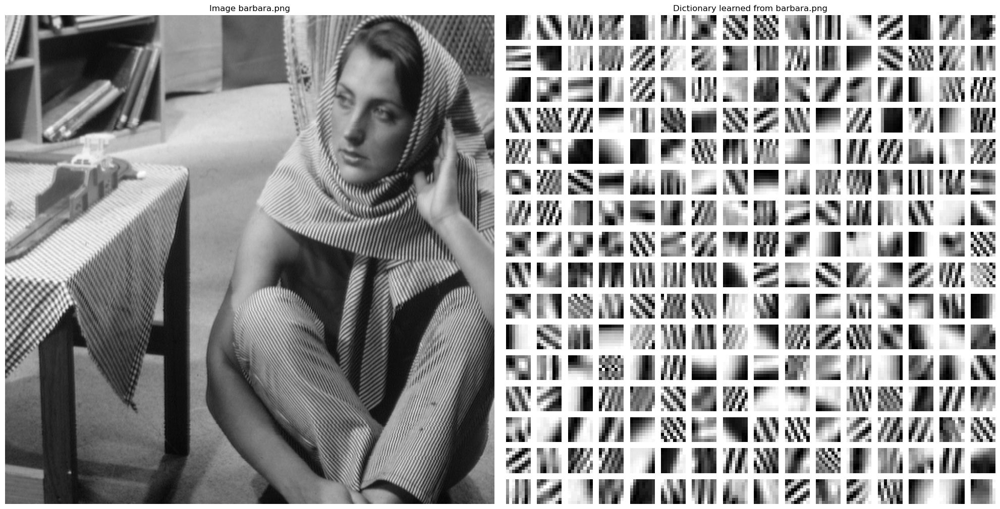

In [75]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(img, cmap='gray')
ax[0].set_title(f'Image {path_image.split("/")[-1]}')
ax[0].axis('off')

img_dict = get_dictionary_img(D)
ax[1].imshow(img_dict, cmap='gray')
ax[1].set_title(f'Dictionary learned from {path_image.split("/")[-1]}')
ax[1].axis('off')

plt.tight_layout()

# OMP denoising with learned dictionaries

In [76]:
img_clean = imread(f'{rootfolder}/data/barbara.png') / 255

sigma_noise = 20/255
noisy_img = img_clean + np.random.normal(0, sigma_noise, size=imsz)

In [77]:
psnr_noisy = 10 * np.log10(1/np.mean(np.square(noisy_img - img_clean)))

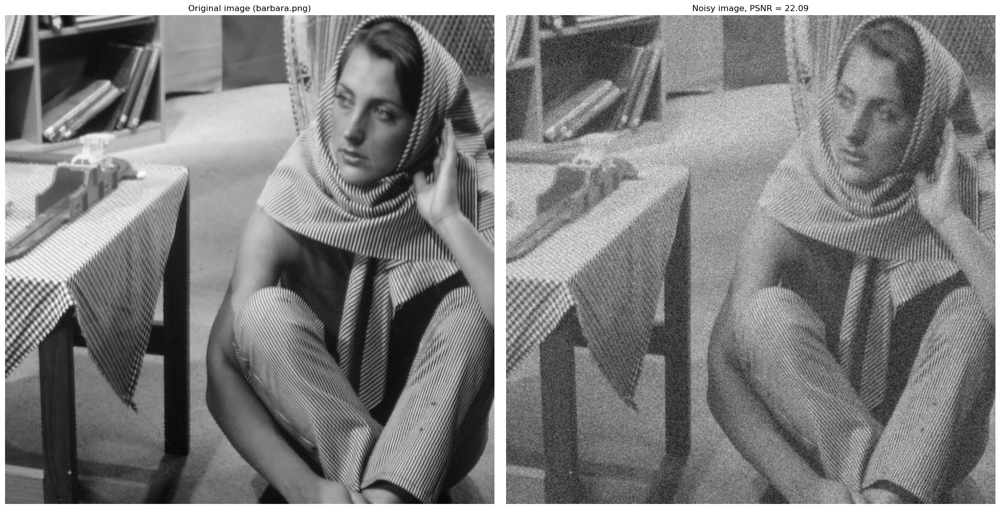

In [78]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(img_clean, cmap='gray')
ax[0].set_title(f'Original image (barbara.png)')
ax[0].axis('off')

ax[1].imshow(noisy_img, cmap='gray')
ax[1].set_title(f'Noisy image, PSNR = {psnr_noisy:.2f}')
ax[1].axis('off')

plt.tight_layout()

In [79]:
p = 8           # patch size
M = p ** 2      # no. of elements in the patch
N = 256         # no. of columns of the dictionary
max_iter = 10   # maximum no. of iterations of the KSVD
L = 4           # sparsity level

Generic dictionary

In [80]:
D_generic = loadmat(f'{rootfolder}/data/dict_nat_img.mat')['D']

Dictionary learned from a different image

In [81]:
img = imread(f'{rootfolder}/data/cameraman.png') / 255
# Extract random patches
npatch = 10000
imsz_diff = img.shape

S_diff = np.zeros((M, npatch))
for i in range(npatch):
    # Pick the patch where (r,c) is the position of the upper-left pixel
    r = np.random.randint(imsz_diff[0] - p + 1)
    c = np.random.randint(imsz_diff[1] - p + 1)
    S_diff[:, i] = img[r:r+p, c:c+p].flatten()

S_diff = S_diff - np.mean(S_diff, axis=0, keepdims=True)

# Learn the dictionary
D_diff = ksvd(S_diff, M, N, max_iter, npatch, L, print_time=True)

Iteration 0 runtime: 14.325748682022095
Iteration 1 runtime: 14.49636697769165
Iteration 2 runtime: 13.399864196777344
Iteration 3 runtime: 13.834352493286133
Iteration 4 runtime: 13.435701608657837
Iteration 5 runtime: 14.43775749206543
Iteration 6 runtime: 14.40159797668457
Iteration 7 runtime: 13.391523599624634
Iteration 8 runtime: 15.337724685668945
Iteration 9 runtime: 19.989837169647217


Dictionary learned from the noisy image

In [82]:
# Extract random patches
npatch = 10000

S = np.zeros((M, npatch))
for i in range(npatch):
    # Pick the patch where (r,c) is the position of the upper-left pixel
    r = np.random.randint(imsz[0] - p + 1)
    c = np.random.randint(imsz[1] - p + 1)
    S[:, i] = noisy_img[r:r+p, c:c+p].flatten()

S = S - np.mean(S, axis=0, keepdims=True)

# Learn the dictionary
D_noisy = ksvd(S, M, N, max_iter, npatch, L, print_time=True)

Iteration 0 runtime: 19.063350439071655
Iteration 1 runtime: 20.523228645324707
Iteration 2 runtime: 16.57331347465515
Iteration 3 runtime: 17.853682279586792
Iteration 4 runtime: 16.282251834869385
Iteration 5 runtime: 19.327651977539062
Iteration 6 runtime: 19.953043937683105
Iteration 7 runtime: 18.790430307388306
Iteration 8 runtime: 18.818402528762817
Iteration 9 runtime: 19.008747816085815


Dictionary learned from the clean image

In [83]:
# Extract random patches
npatch = 10000

S = np.zeros((M, npatch))
for i in range(npatch):
    # Pick the patch where (r,c) is the position of the upper-left pixel
    r = np.random.randint(imsz[0] - p + 1)
    c = np.random.randint(imsz[1] - p + 1)
    S[:, i] = img_clean[r:r+p, c:c+p].flatten()

S = S - np.mean(S, axis=0, keepdims=True)

# Learn the dictionary
D_clean = ksvd(S, M, N, max_iter, npatch, L, print_time=True)

Iteration 0 runtime: 22.13079810142517
Iteration 1 runtime: 18.593544483184814
Iteration 2 runtime: 17.59255290031433
Iteration 3 runtime: 21.046496391296387
Iteration 4 runtime: 29.391517639160156
Iteration 5 runtime: 22.531569480895996
Iteration 6 runtime: 25.6947603225708
Iteration 7 runtime: 21.035095691680908
Iteration 8 runtime: 17.33563494682312
Iteration 9 runtime: 17.062962532043457


OMP denoising

In [84]:
def omp_denoising(noisy_img, D, step, tau):
    """
    Image denoising using Orthogonal Matching Pursuit (OMP).

    Parameters
    ----------
    noisy_img : numpy.ndarray
        A 2D array representing the input noisy image.
    D : numpy.ndarray
        A 2D array of shape (M, N) representing the trained dictionary matrix.
    step : int
        The step size between consecutive patches.
    tau : float
        The stopping threshold for the residual norm passed to the OMP algorithm.

    Returns
    -------
    img_denoised : numpy.ndarray
        A 2D array containing the reconstructed denoised image.
    """

    # Input validation
    if not isinstance(D, np.ndarray) or not isinstance(noisy_img, np.ndarray):
        raise TypeError("D and noisy_image must be numpy arrays!")
    if D.ndim != 2 or noisy_img.ndim != 2:
        raise ValueError(
            f"Expected D and noisy_img to be 2D, got {D.ndim}D and {noisy_img.ndim}D.")
    if not isinstance(step, int) or step <= 0:
        raise ValueError("The step must be a positive integer!")
    if tau < 0:
        raise ValueError("The threshold must be positive!")

    # Initialize the estimated image
    img_hat = np.zeros_like(noisy_img)
    imsz = noisy_img.shape
    p = 8
    # Initialize the weight matrix
    weights = np.zeros_like(noisy_img)
    for i in range(0, imsz[0] - p + 1, step):
        for j in range(0, imsz[1] - p + 1, step):
            # Extrach the patch with the top left corner at pixel (i, j)
            s = noisy_img[i:i + p, j:j + p].flatten()

            # Store and subtract the mean
            patch_mean = np.mean(s)
            s -= patch_mean

            # Perform the sparse coding (with OMP)
            x = OMP(s, D, imsz[0], tau)

            # Perform the reconstruction
            s_hat = D @ x

            # Add back the mean
            s_hat += patch_mean

            # Put the denoised patch into the estimated image using uniform weights
            w = 1
            img_hat[i:i + p, j:j + p] += w * s_hat.reshape(p, p)

            # Store the weights of the current patch in the weight matrix
            weights[i:i + p, j:j + p] += w

    return img_hat / weights

Denoising using the learned dictionaries

In [85]:
# Set the threshold
tau = 1.15 * p * sigma_noise

# Define the step
step = 4
# step = p                  non-overlapping patches

Solve the four denoising problems

In [86]:
# Denoising with dictionary D_generic
img_hat_generic = omp_denoising(noisy_img, D_generic, step, tau)

# Denoising with dictionary D_diff
img_hat_diff = omp_denoising(noisy_img, D_diff, step, tau)

# Denoising with dictionary D_noisy
img_hat_noisy = omp_denoising(noisy_img, D_noisy, step, tau)

# Denoising with dictionary D_clean
img_hat_clean = omp_denoising(noisy_img, D_clean, step, tau)

Visualize the results

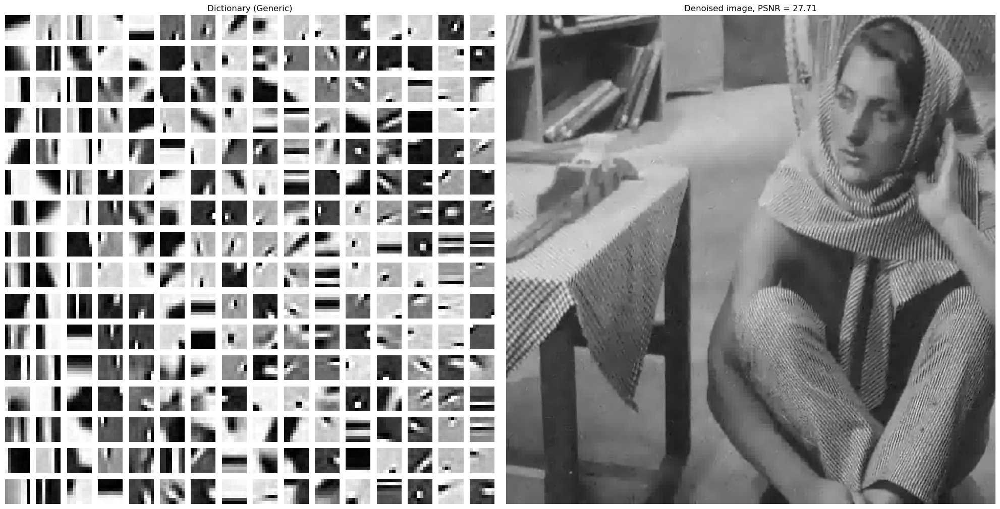

In [87]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(get_dictionary_img(D_generic), cmap='gray')
ax[0].set_title('Dictionary (Generic)')
ax[0].axis('off')

psnr_hat = 10 * np.log10(1/np.mean(np.square(img_hat_generic - img_clean)))

ax[1].imshow(img_hat_generic, cmap='gray')
ax[1].set_title(f'Denoised image, PSNR = {psnr_hat:.2f}')
ax[1].axis('off')

plt.tight_layout()

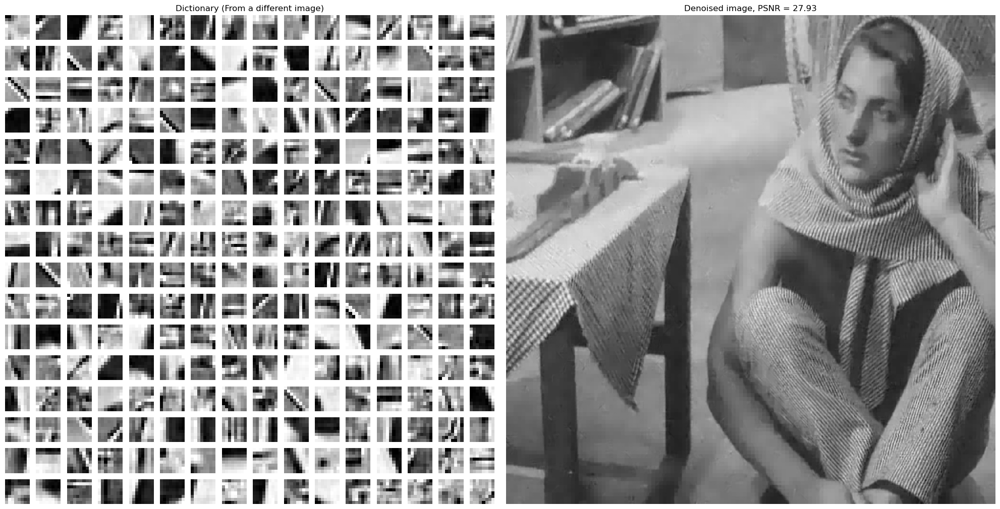

In [88]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(get_dictionary_img(D_diff), cmap='gray')
ax[0].set_title('Dictionary (From a different image)')
ax[0].axis('off')

psnr_hat = 10 * np.log10(1/np.mean(np.square(img_hat_diff - img_clean)))

ax[1].imshow(img_hat_diff, cmap='gray')
ax[1].set_title(f'Denoised image, PSNR = {psnr_hat:.2f}')
ax[1].axis('off')

plt.tight_layout()

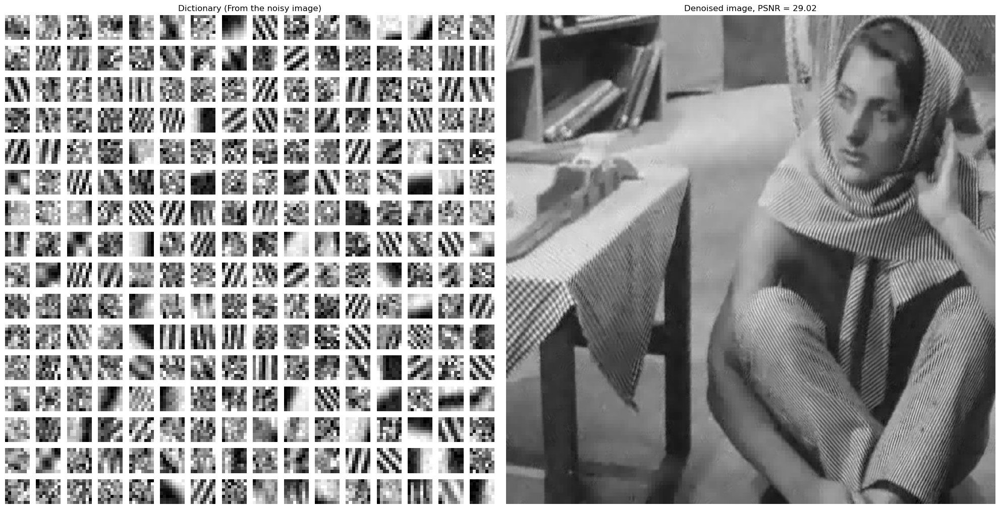

In [89]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(get_dictionary_img(D_noisy), cmap='gray')
ax[0].set_title('Dictionary (From the noisy image)')
ax[0].axis('off')

psnr_hat = 10 * np.log10(1/np.mean(np.square(img_hat_noisy - img_clean)))

ax[1].imshow(img_hat_noisy, cmap='gray')
ax[1].set_title(f'Denoised image, PSNR = {psnr_hat:.2f}')
ax[1].axis('off')

plt.tight_layout()

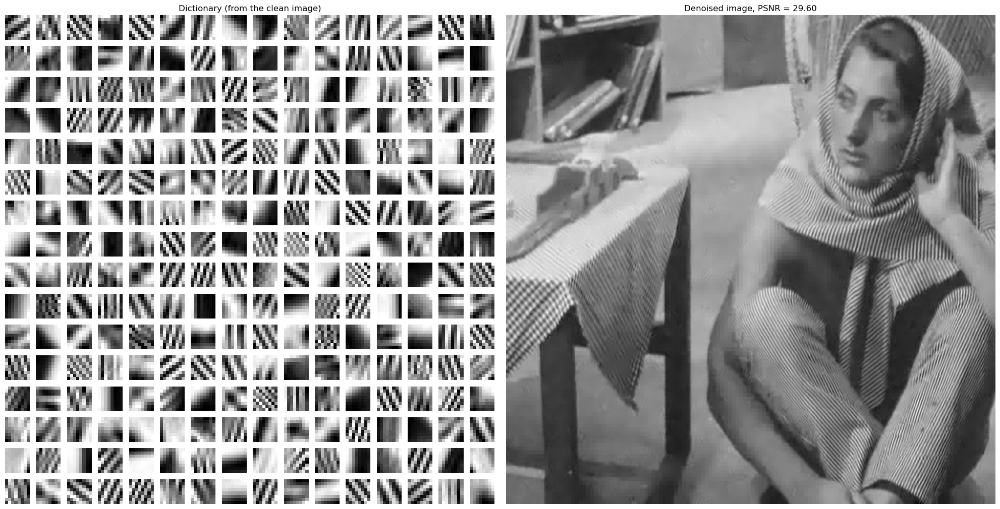

In [90]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(get_dictionary_img(D_clean), cmap='gray')
ax[0].set_title('Dictionary (from the clean image)')
ax[0].axis('off')

psnr_hat = 10 * np.log10(1/np.mean(np.square(img_hat_clean - img_clean)))

ax[1].imshow(img_hat_clean, cmap='gray')
ax[1].set_title(f'Denoised image, PSNR = {psnr_hat:.2f}')
ax[1].axis('off')

plt.tight_layout()

# Extra Assignment: Learn textures

Use k-SVD dictionary learning algorithm to learn dictionaries from text-rich 
images downloaded from the Brodatz dataset 
(`brodatz_1.1.03.tiff`, `brodatz_1.1.04.tiff` and `brodatz_1.1.06.tiff`)  
The input parameters required by k-SVD (`max_iter` and the sparsity level `L`), 
as well as the dimensionality of the dictionary and the number of patches in the training set (`npatch`), 
are left the same throughout the experiments

In [91]:
max_iter = 10
L = 4
p = 8                                           # patch size
M = p ** 2                                      # no. of elements in the patch
N = 256                                         # no. of columns in the dictionary
npatch = 10000

Start with learning the dictionary from `brodatz_1.1.03.tiff`, representing straws

In [92]:
img = imread('./data/brodatz_1.1.03.tiff') / 255
imsz = img.shape

S = np.zeros((M, npatch))

for i in range(npatch):
    r = np.random.randint(imsz[0] - p + 1)
    c = np.random.randint(imsz[1] - p + 1)
    S[:, i] = img[r:r+p, c:c+p].flatten()

S = S - np.mean(S, axis=0, keepdims=True)

D_straw = ksvd(S, M, N, max_iter, npatch, L, print_time=False)

Show the learned dictionary `D_straw`

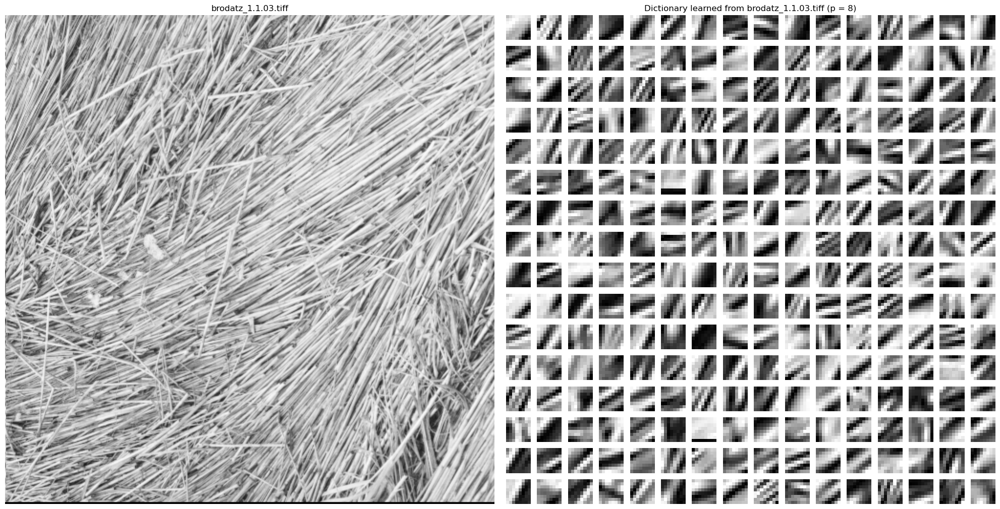

In [93]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(img, cmap='gray')
ax[0].set_title(f'brodatz_1.1.03.tiff')
ax[0].axis('off')

img_dict = get_dictionary_img(D_straw)
ax[1].imshow(img_dict, cmap='gray')
ax[1].set_title(f'Dictionary learned from brodatz_1.1.03.tiff (p = {p})')
ax[1].axis('off')

plt.tight_layout()

Proceed with the image `brodatz_1.1.04.tiff`, depicting a piece of Herringbone 
weave

In [94]:
img = imread('./data/brodatz_1.1.04.tiff') / 255
imsz = img.shape

S = np.zeros((M, npatch))

for i in range(npatch):
    r = np.random.randint(imsz[0] - p + 1)
    c = np.random.randint(imsz[1] - p + 1)
    S[:, i] = img[r:r+p, c:c+p].flatten()

S = S - np.mean(S, axis=0, keepdims=True)

D_weave = ksvd(S, M, N, max_iter, npatch, L, print_time=False)

Show the learned dictionary `D_weave`

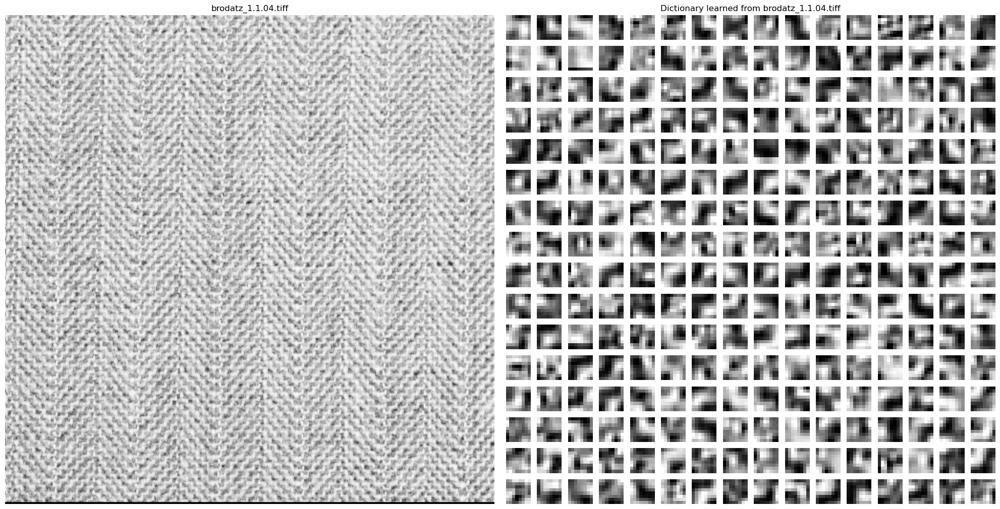

In [95]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(img, cmap='gray')
ax[0].set_title(f'brodatz_1.1.04.tiff')
ax[0].axis('off')

img_dict = get_dictionary_img(D_weave)
ax[1].imshow(img_dict, cmap='gray')
ax[1].set_title(f'Dictionary learned from brodatz_1.1.04.tiff')
ax[1].axis('off')

plt.tight_layout()

Finally, it is the turn of `brodatz_1.1.06.tiff`, representing pressed calf leather

In [96]:
img = imread('./data/brodatz_1.1.06.tiff') / 255
imsz = img.shape

S = np.zeros((M, npatch))

for i in range(npatch):
    r = np.random.randint(imsz[0] - p + 1)
    c = np.random.randint(imsz[1] - p + 1)
    S[:, i] = img[r:r+p, c:c+p].flatten()

S = S - np.mean(S, axis=0, keepdims=True)

D_leather = ksvd(S, M, N, max_iter, npatch, L, print_time=False)

Show the learned dictionary `D_leather`

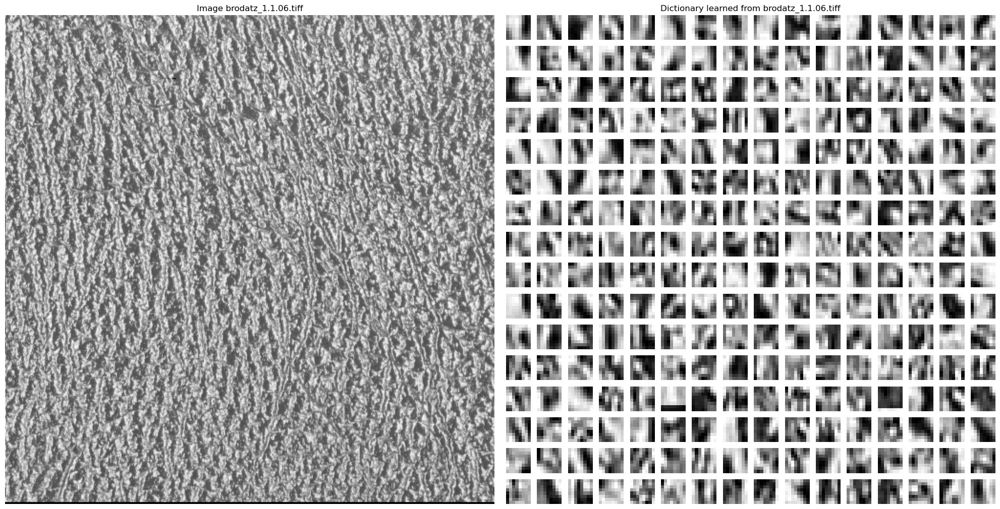

In [97]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(img, cmap='gray')
ax[0].set_title(f'Image brodatz_1.1.06.tiff')
ax[0].axis('off')

img_dict = get_dictionary_img(D_leather)
ax[1].imshow(img_dict, cmap='gray')
ax[1].set_title(f'Dictionary learned from brodatz_1.1.06.tiff')
ax[1].axis('off')

plt.tight_layout()

Now, repeat the learning procedure for `D_straw`, varying the patch size to `p = 16` and show the dictionary

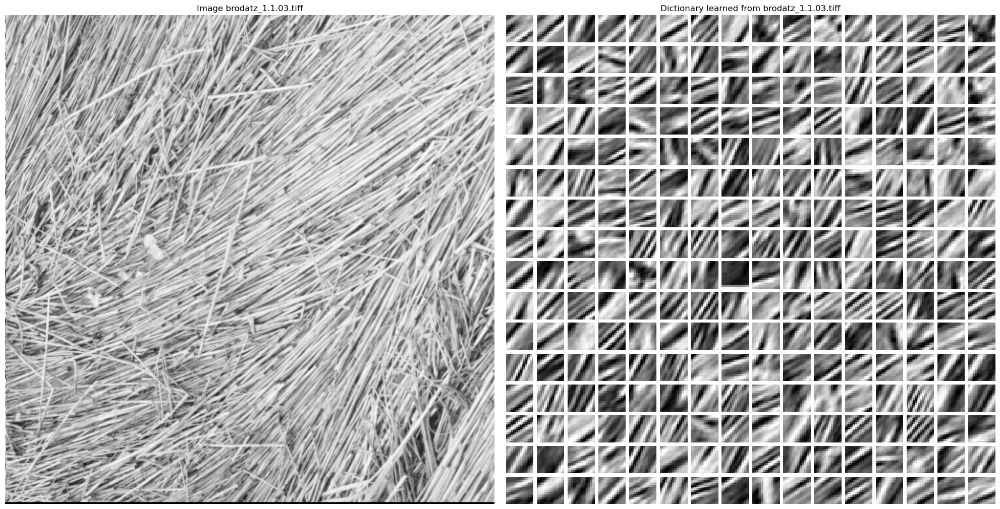

In [98]:
img = imread('./data/brodatz_1.1.03.tiff') / 255
imsz = img.shape

p = 16
M = p ** 2
S = np.zeros((M, npatch))

for i in range(npatch):
    r = np.random.randint(imsz[0] - p + 1)
    c = np.random.randint(imsz[1] - p + 1)
    S[:, i] = img[r:r+p, c:c+p].flatten()

S = S - np.mean(S, axis=0, keepdims=True)
D_straw = ksvd(S, M, N, max_iter, npatch, L, print_time=False)
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(img, cmap='gray')
ax[0].set_title(f'Image brodatz_1.1.03.tiff')
ax[0].axis('off')

img_dict = get_dictionary_img(D_straw)
ax[1].imshow(img_dict, cmap='gray')
ax[1].set_title(f'Dictionary learned from brodatz_1.1.03.tiff')
ax[1].axis('off')

plt.tight_layout()